In [46]:
# Import required packages 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import missingno as msno
# import squarify
from scipy.stats import chi2_contingency
from sklearn.preprocessing import LabelEncoder

from sklearn.linear_model import LogisticRegression # logistic regression
from sklearn import svm # support vector Machine
from sklearn.ensemble import RandomForestClassifier # Random Forest
from sklearn.neighbors import KNeighborsClassifier # KNN
from sklearn.naive_bayes import GaussianNB # Naive bayes
from sklearn.tree import DecisionTreeClassifier # Decision Tree
from sklearn.model_selection import train_test_split # training and testing data split
from sklearn import metrics # accuracy measure
from sklearn.metrics import confusion_matrix # confusion matrix
sns.set_theme(style="whitegrid")

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


In [47]:
# Load dataset
path = r'datasets/bank-additional-full.csv'
df = pd.read_csv(path, sep=';', index_col=False, low_memory=False)


In [48]:
df.head()


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [50]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [51]:
df.shape

(41188, 21)

In [52]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [53]:
df = df.astype({'job':'category', 'marital':'category', 'education':'category', 'default':'category', 'housing':'category', 'loan':'category', 'contact':'category', 'month':'category', 'day_of_week':'category', 'poutcome':'category', 'y':'category'})


In [54]:
df.dtypes

age                  int64
job               category
marital           category
education         category
default           category
housing           category
loan              category
contact           category
month             category
day_of_week       category
duration             int64
campaign             int64
pdays                int64
previous             int64
poutcome          category
emp.var.rate       float64
cons.price.idx     float64
cons.conf.idx      float64
euribor3m          float64
nr.employed        float64
y                 category
dtype: object

In [55]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41188.0,40.024060,10.421250,17.000,32.000,38.000,47.000,98.000
duration,41188.0,258.285010,259.279249,0.000,102.000,180.000,319.000,4918.000
campaign,41188.0,2.567593,2.770014,1.000,1.000,2.000,3.000,56.000
pdays,41188.0,962.475454,186.910907,0.000,999.000,999.000,999.000,999.000
previous,41188.0,0.172963,0.494901,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41188.0,0.081886,1.570960,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41188.0,93.575664,0.578840,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41188.0,-40.502600,4.628198,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41188.0,3.621291,1.734447,0.634,1.344,4.857,4.961,5.045
nr.employed,41188.0,5167.035911,72.251528,4963.600,5099.100,5191.000,5228.100,5228.100


In [56]:
# Change column names
new_column_names = {
    'contact': 'contact_type',
    'duration': 'last_contact_duration',
    'pdays': 'passed_days',
    'poutcome': 'previous_outcome',
    'emp.var.rate': 'employment_variation_rate', 
    'cons.price.idx': 'consumer_price_index', 
    'cons.conf.idx': 'consumer_confidence_index', 
    'nr.employed': 'number_of_employees' 
}

# Rename the columns
df.rename(columns=new_column_names, inplace=True)


In [57]:
df.isnull().sum()

age                          0
job                          0
marital                      0
education                    0
default                      0
housing                      0
loan                         0
contact_type                 0
month                        0
day_of_week                  0
last_contact_duration        0
campaign                     0
passed_days                  0
previous                     0
previous_outcome             0
employment_variation_rate    0
consumer_price_index         0
consumer_confidence_index    0
euribor3m                    0
number_of_employees          0
y                            0
dtype: int64

In [58]:
# Explore unique values and their counts in a specified column

def explore_column(df, column_name):

    unique_values = df[column_name].unique()
    value_counts = df[column_name].value_counts()
    
    return unique_values, value_counts


In [59]:
unique_values, value_counts = explore_column(df, 'age')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 94, 95, 98]

 ---------------------------------------- 

Value Counts:
age
31    1947
32    1846
33    1833
36    1780
35    1759
      ... 
89       2
91       2
94       1
87       1
95       1
Name: count, Length: 78, dtype: int64


In [60]:
unique_values, value_counts = explore_column(df, 'job')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management', 'retired', 'self-employed', 'services', 'student', 'technician', 'unemployed', 'unknown']

 ---------------------------------------- 

Value Counts:
job
admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64


In [61]:
unique_values, value_counts = explore_column(df, 'marital')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['divorced', 'married', 'single', 'unknown']

 ---------------------------------------- 

Value Counts:
marital
married     24928
single      11568
divorced     4612
unknown        80
Name: count, dtype: int64


In [62]:
unique_values, value_counts = explore_column(df, 'education')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree', 'unknown']

 ---------------------------------------- 

Value Counts:
education
university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: count, dtype: int64


In [63]:
unique_values, value_counts = explore_column(df, 'default')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['no', 'unknown', 'yes']

 ---------------------------------------- 

Value Counts:
default
no         32588
unknown     8597
yes            3
Name: count, dtype: int64


In [64]:
unique_values, value_counts = explore_column(df, 'housing')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['no', 'unknown', 'yes']

 ---------------------------------------- 

Value Counts:
housing
yes        21576
no         18622
unknown      990
Name: count, dtype: int64


In [65]:
unique_values, value_counts = explore_column(df, 'loan')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['no', 'unknown', 'yes']

 ---------------------------------------- 

Value Counts:
loan
no         33950
yes         6248
unknown      990
Name: count, dtype: int64


In [66]:
unique_values, value_counts = explore_column(df, 'contact_type')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['cellular', 'telephone']

 ---------------------------------------- 

Value Counts:
contact_type
cellular     26144
telephone    15044
Name: count, dtype: int64


In [67]:
unique_values, value_counts = explore_column(df, 'month')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['apr', 'aug', 'dec', 'jul', 'jun', 'mar', 'may', 'nov', 'oct', 'sep']

 ---------------------------------------- 

Value Counts:
month
may    13769
jul     7174
aug     6178
jun     5318
nov     4101
apr     2632
oct      718
sep      570
mar      546
dec      182
Name: count, dtype: int64


In [68]:
unique_values, value_counts = explore_column(df, 'day_of_week')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['fri', 'mon', 'thu', 'tue', 'wed']

 ---------------------------------------- 

Value Counts:
day_of_week
thu    8623
mon    8514
wed    8134
tue    8090
fri    7827
Name: count, dtype: int64


In [69]:
unique_values, value_counts = explore_column(df, 'last_contact_duration')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218,

In [70]:
unique_values, value_counts = explore_column(df, 'campaign')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 43, 56]

 ---------------------------------------- 

Value Counts:
campaign
1     17642
2     10570
3      5341
4      2651
5      1599
6       979
7       629
8       400
9       283
10      225
11      177
12      125
13       92
14       69
17       58
16       51
15       51
18       33
20       30
19       26
21       24
22       17
23       16
24       15
27       11
29       10
28        8
26        8
25        8
31        7
30        7
35        5
32        4
33        4
34        3
42        2
40        2
43        2
56        1
39        1
41        1
37        1
Name: count, dtype: int64


In [71]:
unique_values, value_counts = explore_column(df, 'passed_days')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 999]

 ---------------------------------------- 

Value Counts:
passed_days
999    39673
3        439
6        412
4        118
9         64
2         61
7         60
12        58
10        52
5         46
13        36
11        28
1         26
15        24
14        20
8         18
0         15
16        11
17         8
18         7
22         3
19         3
21         2
25         1
26         1
27         1
20         1
Name: count, dtype: int64


In [72]:
unique_values, value_counts = explore_column(df, 'previous')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[0, 1, 2, 3, 4, 5, 6, 7]

 ---------------------------------------- 

Value Counts:
previous
0    35563
1     4561
2      754
3      216
4       70
5       18
6        5
7        1
Name: count, dtype: int64


In [73]:
unique_values, value_counts = explore_column(df, 'previous_outcome')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['nonexistent', 'failure', 'success']
Categories (3, object): ['failure', 'nonexistent', 'success']

 ---------------------------------------- 

Value Counts:
previous_outcome
nonexistent    35563
failure         4252
success         1373
Name: count, dtype: int64


In [74]:
unique_values, value_counts = explore_column(df, 'employment_variation_rate')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[ 1.1  1.4 -0.1 -0.2 -1.8 -2.9 -3.4 -3.  -1.7 -1.1]

 ---------------------------------------- 

Value Counts:
employment_variation_rate
 1.4    16234
-1.8     9184
 1.1     7763
-0.1     3683
-2.9     1663
-3.4     1071
-1.7      773
-1.1      635
-3.0      172
-0.2       10
Name: count, dtype: int64


In [75]:
unique_values, value_counts = explore_column(df, 'consumer_price_index')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[93.994 94.465 93.918 93.444 93.798 93.2   92.756 92.843 93.075 92.893
 92.963 92.469 92.201 92.379 92.431 92.649 92.713 93.369 93.749 93.876
 94.055 94.215 94.027 94.199 94.601 94.767]

 ---------------------------------------- 

Value Counts:
consumer_price_index
93.994    7763
93.918    6685
92.893    5794
93.444    5175
94.465    4374
93.200    3616
93.075    2458
92.201     770
92.963     715
92.431     447
92.649     357
94.215     311
94.199     303
92.843     282
92.379     267
93.369     264
94.027     233
94.055     229
93.876     212
94.601     204
92.469     178
93.749     174
92.713     172
94.767     128
93.798      67
92.756      10
Name: count, dtype: int64


In [76]:
unique_values, value_counts = explore_column(df, 'consumer_confidence_index')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[-36.4 -41.8 -42.7 -36.1 -40.4 -42.  -45.9 -50.  -47.1 -46.2 -40.8 -33.6
 -31.4 -29.8 -26.9 -30.1 -33.  -34.8 -34.6 -40.  -39.8 -40.3 -38.3 -37.5
 -49.5 -50.8]

 ---------------------------------------- 

Value Counts:
consumer_confidence_index
-36.4    7763
-42.7    6685
-46.2    5794
-36.1    5175
-41.8    4374
-42.0    3616
-47.1    2458
-31.4     770
-40.8     715
-26.9     447
-30.1     357
-40.3     311
-37.5     303
-50.0     282
-29.8     267
-34.8     264
-38.3     233
-39.8     229
-40.0     212
-49.5     204
-33.6     178
-34.6     174
-33.0     172
-50.8     128
-40.4      67
-45.9      10
Name: count, dtype: int64


In [78]:
unique_values, value_counts = explore_column(df, 'euribor3m')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[4.857 4.856 4.855 4.859 4.86  4.858 4.864 4.865 4.866 4.967 4.961 4.959
 4.958 4.96  4.962 4.955 4.947 4.956 4.966 4.963 4.957 4.968 4.97  4.965
 4.964 5.045 5.    4.936 4.921 4.918 4.912 4.827 4.794 4.76  4.733 4.7
 4.663 4.592 4.474 4.406 4.343 4.286 4.245 4.223 4.191 4.153 4.12  4.076
 4.021 3.901 3.879 3.853 3.816 3.743 3.669 3.563 3.488 3.428 3.329 3.282
 3.053 1.811 1.799 1.778 1.757 1.726 1.703 1.687 1.663 1.65  1.64  1.629
 1.614 1.602 1.584 1.574 1.56  1.556 1.548 1.538 1.531 1.52  1.51  1.498
 1.483 1.479 1.466 1.453 1.445 1.435 1.423 1.415 1.41  1.405 1.406 1.4
 1.392 1.384 1.372 1.365 1.354 1.344 1.334 1.327 1.313 1.299 1.291 1.281
 1.266 1.25  1.244 1.259 1.264 1.27  1.262 1.26  1.268 1.286 1.252 1.235
 1.224 1.215 1.206 1.099 1.085 1.072 1.059 1.048 1.044 1.029 1.018 1.007
 0.996 0.979 0.969 0.944 0.937 0.933 0.927 0.921 0.914 0.908 0.903 0.899
 0.884 0.883 0.881 0.879 0.873 0.869 0.861 0.859 0.854 0.851 0.849 0.843
 0.838 0.834 0.829 0.825 0.821 0.819 0.8

In [79]:
unique_values, value_counts = explore_column(df, 'number_of_employees')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
[5191.  5228.1 5195.8 5176.3 5099.1 5076.2 5017.5 5023.5 5008.7 4991.6
 4963.6]

 ---------------------------------------- 

Value Counts:
number_of_employees
5228.1    16234
5099.1     8534
5191.0     7763
5195.8     3683
5076.2     1663
5017.5     1071
4991.6      773
5008.7      650
4963.6      635
5023.5      172
5176.3       10
Name: count, dtype: int64


In [80]:
unique_values, value_counts = explore_column(df, 'y')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)


Unique Values:
['no', 'yes']
Categories (2, object): ['no', 'yes']

 ---------------------------------------- 

Value Counts:
y
no     36548
yes     4640
Name: count, dtype: int64


In [81]:
# Plot Clients Subscription in term deposit
fig = px.pie(df, names='y', title='Distribution of -> Has the client subscribed a term deposit?')
fig.show()


#### 👆🏻 The dataset is imbalanced.

<Axes: >

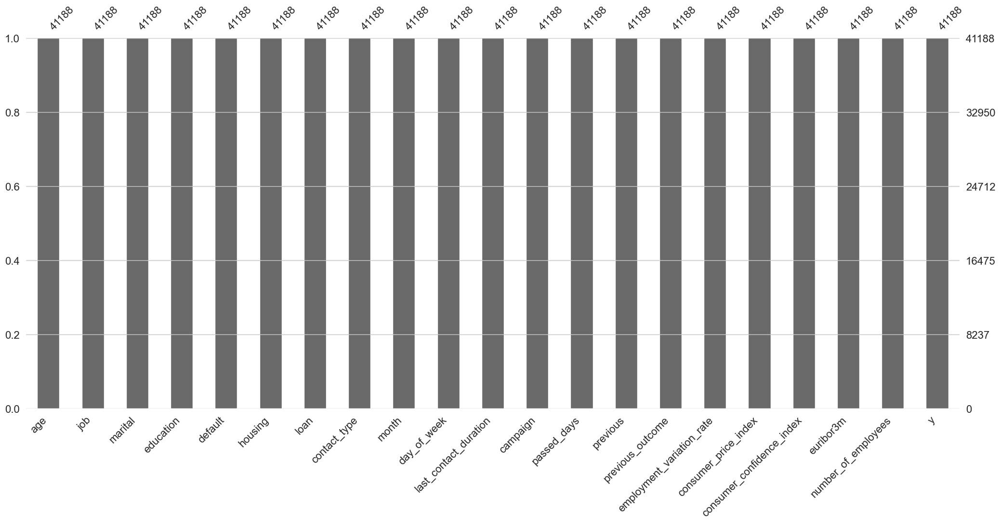

In [82]:
msno.bar(df)


In [83]:
df.duplicated().sum()

12

In [84]:
# Check the duplicated rows

"""
Duplicated rows can introduce bias and skew the analysis results. By removing duplicated rows, analysts can ensure the accuracy and integrity of the data, leading to more reliable insights and conclusions.
"""

duplicate_rows = df[df.duplicated()]

# Print duplicate rows
print("Duplicate Rows except first occurrence:")
print(duplicate_rows)


Duplicate Rows except first occurrence:
       age          job   marital            education  default housing loan  \
1266    39  blue-collar   married             basic.6y       no      no   no   
12261   36      retired   married              unknown       no      no   no   
14234   27   technician    single  professional.course       no      no   no   
16956   47   technician  divorced          high.school       no     yes   no   
18465   32   technician    single  professional.course       no     yes   no   
20216   55     services   married          high.school  unknown      no   no   
20534   41   technician   married  professional.course       no     yes   no   
25217   39       admin.   married    university.degree       no      no   no   
28477   24     services    single          high.school       no     yes   no   
32516   35       admin.   married    university.degree       no     yes   no   
36951   45       admin.   married    university.degree       no      no   no   


In [85]:
# Print duplicated values
duplicated_rows = df[df.duplicated(keep=False)]  # keep=False marks all occurrences as True
duplicated_rows


,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,campaign,passed_days,previous,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y
1265,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,...,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,...,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


In [86]:
"""
For duplicated values, we can do this:
    - Review and Understand.
    - Address Data Entry Issues.
    - Aggregate Duplicates.
    - Flag Duplicates.
    - Handle Partial Duplicates.
    - Identify and Remove Duplicates.
""" 

df = df.drop_duplicates()


In [88]:
df.duplicated().sum()

0

In [87]:
df.sample(10)

,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,...,campaign,passed_days,previous,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y
29148,53,admin.,married,basic.6y,no,yes,no,cellular,apr,fri,...,1,999,0,nonexistent,-1.8,93.075,-47.1,1.405,5099.1,no
5979,36,management,married,university.degree,no,yes,no,telephone,may,tue,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
15322,30,blue-collar,married,basic.6y,unknown,yes,no,cellular,jul,fri,...,4,999,0,nonexistent,1.4,93.918,-42.7,4.957,5228.1,no
40074,21,student,single,unknown,no,no,no,telephone,jul,thu,...,7,999,1,failure,-1.7,94.215,-40.3,0.810,4991.6,no
22919,52,blue-collar,married,basic.4y,no,yes,no,cellular,aug,mon,...,4,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
25047,53,management,married,university.degree,no,yes,yes,cellular,nov,tue,...,1,999,0,nonexistent,-0.1,93.200,-42.0,4.153,5195.8,no
20896,41,housemaid,married,basic.4y,unknown,yes,no,cellular,aug,thu,...,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no
34796,29,services,married,high.school,no,no,no,cellular,may,thu,...,10,999,0,nonexistent,-1.8,92.893,-46.2,1.266,5099.1,no
2807,41,housemaid,married,basic.6y,no,no,no,telephone,may,wed,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.859,5191.0,no
24683,52,admin.,married,basic.4y,no,yes,yes,cellular,nov,mon,...,3,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8,no


In [89]:
# Create a column called has_term_deposit which is going to represent 0 for the negative class and 1 for the positive class based on the bank marketing dataset.
df['has_term_deposit'] = (df.y == 'yes').astype('int')


In [90]:
df[list(df.columns)[:11]].sample(10)

,age,job,marital,education,default,housing,loan,contact_type,month,day_of_week,last_contact_duration
23657,45,management,married,university.degree,no,yes,no,cellular,aug,thu,26
5237,38,blue-collar,married,basic.9y,no,no,no,telephone,may,fri,83
20329,50,management,married,university.degree,no,yes,yes,cellular,aug,mon,342
31716,47,management,married,university.degree,unknown,yes,no,cellular,may,thu,72
25149,49,admin.,married,university.degree,no,no,no,cellular,nov,tue,163
17631,43,unemployed,divorced,basic.9y,no,no,no,cellular,jul,mon,39
24194,55,admin.,single,university.degree,unknown,no,no,cellular,nov,mon,142
30861,34,admin.,married,high.school,no,no,no,cellular,may,tue,295
10653,57,management,divorced,university.degree,unknown,yes,yes,telephone,jun,tue,236
33678,23,student,single,high.school,no,yes,no,cellular,may,wed,435


In [91]:
df[list(df.columns)[11:]].sample(10)

,campaign,passed_days,previous,previous_outcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor3m,number_of_employees,y,has_term_deposit
11319,2,999,0,nonexistent,1.4,94.465,-41.8,4.961,5228.1,no,0
34032,1,999,0,nonexistent,-1.8,92.893,-46.2,1.281,5099.1,no,0
7562,2,999,0,nonexistent,1.1,93.994,-36.4,4.864,5191.0,no,0
20999,1,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no,0
27758,1,999,0,nonexistent,-1.8,92.843,-50.0,1.726,5099.1,yes,1
10515,1,999,0,nonexistent,1.4,94.465,-41.8,4.961,5228.1,no,0
987,2,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no,0
40554,1,999,1,failure,-1.1,94.199,-37.5,0.886,4963.6,no,0
14399,4,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no,0
33706,1,999,1,failure,-1.8,92.893,-46.2,1.281,5099.1,no,0


In [92]:
df.shape

(41176, 22)

In [93]:
df.isnull().sum()

age                          0
job                          0
marital                      0
education                    0
default                      0
housing                      0
loan                         0
contact_type                 0
month                        0
day_of_week                  0
last_contact_duration        0
campaign                     0
passed_days                  0
previous                     0
previous_outcome             0
employment_variation_rate    0
consumer_price_index         0
consumer_confidence_index    0
euribor3m                    0
number_of_employees          0
y                            0
has_term_deposit             0
dtype: int64

<Axes: >

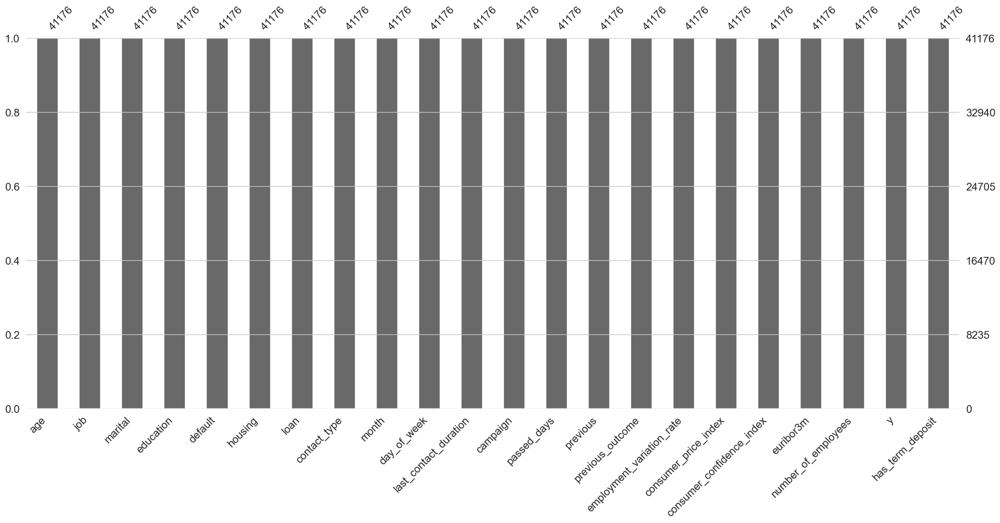

In [94]:
msno.bar(df)


<Axes: >

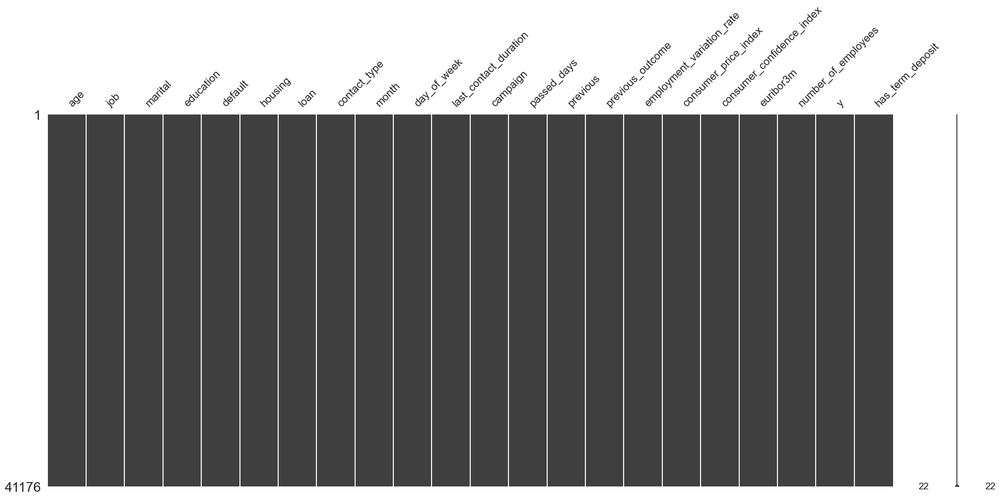

In [95]:
msno.matrix(df)


In [96]:
# Explore unique values and their counts in a specified column

def explore_column(df, column_name):

    unique_values = df[column_name].unique()
    value_counts = df[column_name].value_counts()
    
    return unique_values, value_counts


In [97]:
unique_values, value_counts = explore_column(df, 'age')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
[17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 94, 95, 98]

 ---------------------------------------- 

Value Counts:
age
31    1947
32    1845
33    1833
36    1779
35    1758
      ... 
89       2
91       2
94       1
87       1
95       1
Name: count, Length: 78, dtype: int64


In [98]:
unique_values, value_counts = explore_column(df, 'job')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['housemaid', 'services', 'admin.', 'blue-collar', 'technician', ..., 'unemployed', 'self-employed', 'unknown', 'entrepreneur', 'student']
Length: 12
Categories (12, object): ['admin.', 'blue-collar', 'entrepreneur', 'housemaid', ..., 'student', 'technician', 'unemployed', 'unknown']

 ---------------------------------------- 

Value Counts:
job
admin.           10419
blue-collar       9253
technician        6739
services          3967
management        2924
retired           1718
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64


In [99]:
unique_values, value_counts = explore_column(df, 'marital')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['married', 'single', 'divorced', 'unknown']
Categories (4, object): ['divorced', 'married', 'single', 'unknown']

 ---------------------------------------- 

Value Counts:
marital
married     24921
single      11564
divorced     4611
unknown        80
Name: count, dtype: int64


In [100]:
unique_values, value_counts = explore_column(df, 'education')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['basic.4y', 'high.school', 'basic.6y', 'basic.9y', 'professional.course', 'unknown', 'university.degree', 'illiterate']
Categories (8, object): ['basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree', 'unknown']

 ---------------------------------------- 

Value Counts:
education
university.degree      12164
high.school             9512
basic.9y                6045
professional.course     5240
basic.4y                4176
basic.6y                2291
unknown                 1730
illiterate                18
Name: count, dtype: int64


In [101]:
unique_values, value_counts = explore_column(df, 'default')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['no', 'unknown', 'yes']
Categories (3, object): ['no', 'unknown', 'yes']

 ---------------------------------------- 

Value Counts:
default
no         32577
unknown     8596
yes            3
Name: count, dtype: int64


In [102]:
unique_values, value_counts = explore_column(df, 'housing')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['no', 'yes', 'unknown']
Categories (3, object): ['no', 'unknown', 'yes']

 ---------------------------------------- 

Value Counts:
housing
yes        21571
no         18615
unknown      990
Name: count, dtype: int64


In [103]:
unique_values, value_counts = explore_column(df, 'loan')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['no', 'yes', 'unknown']
Categories (3, object): ['no', 'unknown', 'yes']

 ---------------------------------------- 

Value Counts:
loan
no         33938
yes         6248
unknown      990
Name: count, dtype: int64


In [104]:
unique_values, value_counts = explore_column(df, 'contact_type')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['telephone', 'cellular']
Categories (2, object): ['cellular', 'telephone']

 ---------------------------------------- 

Value Counts:
contact_type
cellular     26135
telephone    15041
Name: count, dtype: int64


In [105]:
unique_values, value_counts = explore_column(df, 'month')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'mar', 'apr', 'sep']
Categories (10, object): ['apr', 'aug', 'dec', 'jul', ..., 'may', 'nov', 'oct', 'sep']

 ---------------------------------------- 

Value Counts:
month
may    13767
jul     7169
aug     6176
jun     5318
nov     4100
apr     2631
oct      717
sep      570
mar      546
dec      182
Name: count, dtype: int64


In [106]:
unique_values, value_counts = explore_column(df, 'day_of_week')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['mon', 'tue', 'wed', 'thu', 'fri']
Categories (5, object): ['fri', 'mon', 'thu', 'tue', 'wed']

 ---------------------------------------- 

Value Counts:
day_of_week
thu    8618
mon    8512
wed    8134
tue    8086
fri    7826
Name: count, dtype: int64


In [107]:
unique_values, value_counts = explore_column(df, 'last_contact_duration')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218,

In [108]:
unique_values, value_counts = explore_column(df, 'campaign')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 19 18 23 14 22 25 16 17 15 20 56
 39 35 42 28 26 27 32 21 24 29 31 30 41 37 40 33 34 43]

 ---------------------------------------- 

Value Counts:
campaign
1     17634
2     10568
3      5340
4      2650
5      1599
6       979
7       629
8       400
9       283
10      225
11      177
12      125
13       92
14       69
17       58
16       51
15       51
18       33
20       30
19       26
21       24
22       17
23       16
24       15
27       11
29       10
28        8
26        8
25        8
31        7
30        7
35        5
32        4
33        4
34        3
42        2
40        2
43        2
56        1
39        1
41        1
37        1
Name: count, dtype: int64


In [109]:
unique_values, value_counts = explore_column(df, 'passed_days')

print("Unique Values:")
print(sorted(unique_values))

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 999]

 ---------------------------------------- 

Value Counts:
passed_days
999    39661
3        439
6        412
4        118
9         64
2         61
7         60
12        58
10        52
5         46
13        36
11        28
1         26
15        24
14        20
8         18
0         15
16        11
17         8
18         7
22         3
19         3
21         2
25         1
26         1
27         1
20         1
Name: count, dtype: int64


In [110]:
unique_values, value_counts = explore_column(df, 'previous')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
[0 1 2 3 4 5 6 7]

 ---------------------------------------- 

Value Counts:
previous
0    35551
1     4561
2      754
3      216
4       70
5       18
6        5
7        1
Name: count, dtype: int64


In [111]:
unique_values, value_counts = explore_column(df, 'previous_outcome')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
['nonexistent', 'failure', 'success']
Categories (3, object): ['failure', 'nonexistent', 'success']

 ---------------------------------------- 

Value Counts:
previous_outcome
nonexistent    35551
failure         4252
success         1373
Name: count, dtype: int64


In [112]:
unique_values, value_counts = explore_column(df, 'employment_variation_rate')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
[ 1.1  1.4 -0.1 -0.2 -1.8 -2.9 -3.4 -3.  -1.7 -1.1]

 ---------------------------------------- 

Value Counts:
employment_variation_rate
 1.4    16228
-1.8     9182
 1.1     7762
-0.1     3682
-2.9     1662
-3.4     1070
-1.7      773
-1.1      635
-3.0      172
-0.2       10
Name: count, dtype: int64


In [113]:
unique_values, value_counts = explore_column(df, 'consumer_price_index')

print("Unique Values:")
print(unique_values)

print("\n", '-' * 40, "\n")

print("Value Counts:")
print(value_counts)

Unique Values:
[93.994 94.465 93.918 93.444 93.798 93.2   92.756 92.843 93.075 92.893
 92.963 92.469 92.201 92.379 92.431 92.649 92.713 93.369 93.749 93.876
 94.055 94.215 94.027 94.199 94.601 94.767]

 ---------------------------------------- 

Value Counts:
consumer_price_index
93.994    7762
93.918    6681
92.893    5793
93.444    5173
94.465    4374
93.200    3615
93.075    2457
92.201     770
92.963     715
92.431     446
92.649     357
94.215     311
94.199     303
92.843     282
92.379     267
93.369     264
94.027     233
94.055     229
93.876     212
94.601     204
92.469     177
93.749     174
92.713     172
94.767     128
93.798      67
92.756      10
Name: count, dtype: int64


In [114]:
unique_values, value_counts = explore_column(df, 'consumer_confidence_index')

print("Unique Values:\n", unique_values)
print("\n", '-' * 40, "\n")
print("Value Counts:\n", value_counts)


Unique Values:
 [-36.4 -41.8 -42.7 -36.1 -40.4 -42.  -45.9 -50.  -47.1 -46.2 -40.8 -33.6
 -31.4 -29.8 -26.9 -30.1 -33.  -34.8 -34.6 -40.  -39.8 -40.3 -38.3 -37.5
 -49.5 -50.8]

 ---------------------------------------- 

Value Counts:
 consumer_confidence_index
-36.4    7762
-42.7    6681
-46.2    5793
-36.1    5173
-41.8    4374
-42.0    3615
-47.1    2457
-31.4     770
-40.8     715
-26.9     446
-30.1     357
-40.3     311
-37.5     303
-50.0     282
-29.8     267
-34.8     264
-38.3     233
-39.8     229
-40.0     212
-49.5     204
-33.6     177
-34.6     174
-33.0     172
-50.8     128
-40.4      67
-45.9      10
Name: count, dtype: int64


In [115]:
unique_values, value_counts = explore_column(df, 'euribor3m')

print("Unique Values:\n", unique_values)
print("\n", '-' * 40, "\n")
print("Value Counts:\n", value_counts)


Unique Values:
 [4.857 4.856 4.855 4.859 4.86  4.858 4.864 4.865 4.866 4.967 4.961 4.959
 4.958 4.96  4.962 4.955 4.947 4.956 4.966 4.963 4.957 4.968 4.97  4.965
 4.964 5.045 5.    4.936 4.921 4.918 4.912 4.827 4.794 4.76  4.733 4.7
 4.663 4.592 4.474 4.406 4.343 4.286 4.245 4.223 4.191 4.153 4.12  4.076
 4.021 3.901 3.879 3.853 3.816 3.743 3.669 3.563 3.488 3.428 3.329 3.282
 3.053 1.811 1.799 1.778 1.757 1.726 1.703 1.687 1.663 1.65  1.64  1.629
 1.614 1.602 1.584 1.574 1.56  1.556 1.548 1.538 1.531 1.52  1.51  1.498
 1.483 1.479 1.466 1.453 1.445 1.435 1.423 1.415 1.41  1.405 1.406 1.4
 1.392 1.384 1.372 1.365 1.354 1.344 1.334 1.327 1.313 1.299 1.291 1.281
 1.266 1.25  1.244 1.259 1.264 1.27  1.262 1.26  1.268 1.286 1.252 1.235
 1.224 1.215 1.206 1.099 1.085 1.072 1.059 1.048 1.044 1.029 1.018 1.007
 0.996 0.979 0.969 0.944 0.937 0.933 0.927 0.921 0.914 0.908 0.903 0.899
 0.884 0.883 0.881 0.879 0.873 0.869 0.861 0.859 0.854 0.851 0.849 0.843
 0.838 0.834 0.829 0.825 0.821 0.819 0.

In [116]:
unique_values, value_counts = explore_column(df, 'number_of_employees')

print("Unique Values:\n", unique_values)
print("\n", '-' * 40, "\n")
print("Value Counts:\n", value_counts)


Unique Values:
 [5191.  5228.1 5195.8 5176.3 5099.1 5076.2 5017.5 5023.5 5008.7 4991.6
 4963.6]

 ---------------------------------------- 

Value Counts:
 number_of_employees
5228.1    16228
5099.1     8532
5191.0     7762
5195.8     3682
5076.2     1662
5017.5     1070
4991.6      773
5008.7      650
4963.6      635
5023.5      172
5176.3       10
Name: count, dtype: int64


In [117]:
unique_values, value_counts = explore_column(df, 'y')

print("Unique Values:\n", unique_values)
print("\n", '-' * 40, "\n")
print("Value Counts:\n", value_counts)


Unique Values:
 ['no', 'yes']
Categories (2, object): ['no', 'yes']

 ---------------------------------------- 

Value Counts:
 y
no     36537
yes     4639
Name: count, dtype: int64


In [119]:
unique_values, value_counts = explore_column(df, 'has_term_deposit')

print("Unique Values:\n", unique_values)
print("\n", '-' * 40, "\n")
print("Value Counts:\n", value_counts)


Unique Values:
 [0 1]

 ---------------------------------------- 

Value Counts:
 has_term_deposit
0    36537
1     4639
Name: count, dtype: int64


In [121]:
# See the correlations between categorical variables

def plot_categorical_count(df, x_column, hue_column, title, palette='Paired'):
    """
    Plot a count plot for categorical variables.

    Parameters:
    - x_column: str, column to be plotted on the x-axis
    - hue_column: str, column to differentiate by color (typically the target variable)
    - title: str, plot title
    """
    plt.figure(figsize=(20, 10))
    sns.countplot(x=x_column, hue=hue_column, data=df, palette=palette)

    # Customize the plot
    plt.title(title)
    plt.xlabel(x_column)
    plt.ylabel('Count')
    plt.legend(title=hue_column, loc='upper right')

    # Show the plot
    plt.show()

In [122]:
# See the correlations between categorical variables (Plotly package)

def plotly_categorical_count(df, x_column, hue_column, title, color_discrete_sequence=None):
    """
    Plot a count plot for categorical variables using Plotly.

    Parameters:
    - x_column: str, column to be plotted on the x-axis
    - hue_column: str, column to differentiate by color (typically the target variable)
    - title: str, plot title
    - color_discrete_sequence: list of str, optional, color palette for the plot
    """
    fig = px.histogram(df, x=x_column, color=hue_column, title=title,
                       color_discrete_sequence=color_discrete_sequence)

    # Customize the plot
    fig.update_layout(
        xaxis_title=x_column,
        yaxis_title='Count',
        legend_title=hue_column,
        barmode='group',
        bargap=0.1,
        showlegend=True,
        legend=dict(x=1.02, y=1)
    )

    # Show the plot
    fig.show()


In [123]:
df.groupby(['job','y'])['y'].count()

job            y  
admin.         no     9068
               yes    1351
blue-collar    no     8615
               yes     638
entrepreneur   no     1332
               yes     124
housemaid      no      954
               yes     106
management     no     2596
               yes     328
retired        no     1284
               yes     434
self-employed  no     1272
               yes     149
services       no     3644
               yes     323
student        no      600
               yes     275
technician     no     6009
               yes     730
unemployed     no      870
               yes     144
unknown        no      293
               yes      37
Name: y, dtype: int64

In [124]:
pd.crosstab(df.y, df.job, margins=True).style.background_gradient(cmap='summer_r')


job,admin.,blue-collar,entrepreneur,housemaid,management,retired,self-employed,services,student,technician,unemployed,unknown,All
y,,,,,,,,,,,,,
no,9068,8615,1332,954,2596,1284,1272,3644,600,6009,870,293,36537
yes,1351,638,124,106,328,434,149,323,275,730,144,37,4639
All,10419,9253,1456,1060,2924,1718,1421,3967,875,6739,1014,330,41176


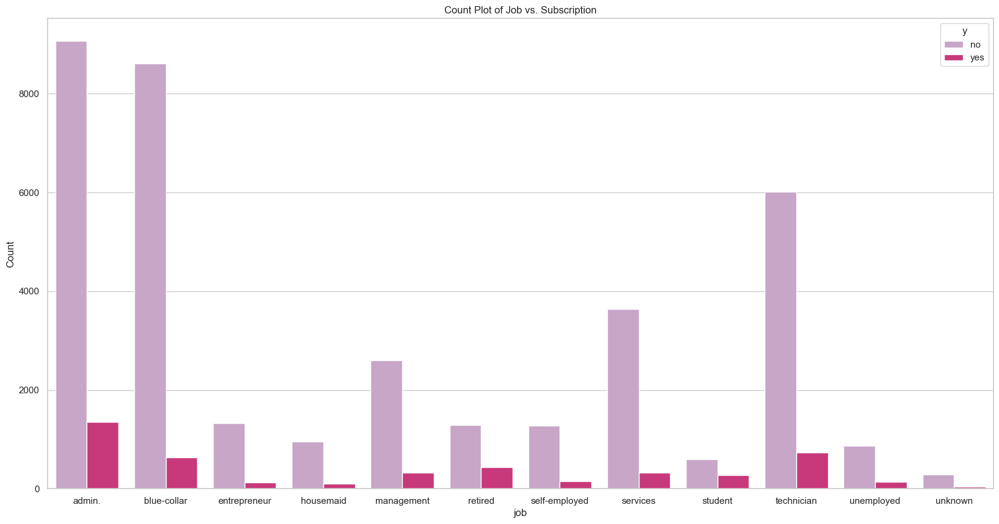

In [125]:
plot_categorical_count(df[['job', 'y']], x_column='job', hue_column='y', title='Count Plot of Job vs. Subscription', palette='PuRd')

In [126]:
# Plotly
plotly_categorical_count(df[['job', 'y']], x_column='job', hue_column='y', title='Count Plot of Job vs. Subscription')

In [127]:
df.groupby(['marital','y'])['y'].count()

marital   y  
divorced  no      4135
          yes      476
married   no     22390
          yes     2531
single    no      9944
          yes     1620
unknown   no        68
          yes       12
Name: y, dtype: int64

In [128]:
pd.crosstab(df.y, df.marital, margins=True).style.background_gradient(cmap='summer_r')


marital,divorced,married,single,unknown,All
y,,,,,
no,4135,22390,9944,68,36537
yes,476,2531,1620,12,4639
All,4611,24921,11564,80,41176


In [129]:
pd.crosstab([df.job, df.y], df.marital, margins=True).style.background_gradient(cmap='summer_r')


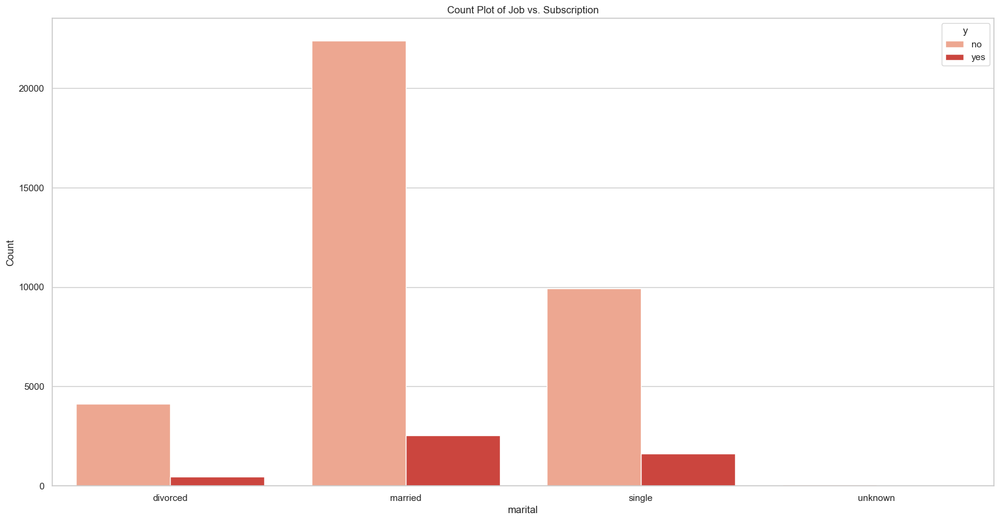

In [130]:
plot_categorical_count(df[['marital', 'y']], x_column='marital', hue_column='y', title='Count Plot of Job vs. Subscription', palette='Reds')


In [131]:
# Plotly
plotly_categorical_count(df[['marital', 'y']], x_column='marital', hue_column='y', title='Count Plot of Marital vs. Subscription')

In [132]:
df.groupby(['education','y'])['y'].count()

education            y  
basic.4y             no      3748
                     yes      428
basic.6y             no      2103
                     yes      188
basic.9y             no      5572
                     yes      473
high.school          no      8481
                     yes     1031
illiterate           no        14
                     yes        4
professional.course  no      4645
                     yes      595
university.degree    no     10495
                     yes     1669
unknown              no      1479
                     yes      251
Name: y, dtype: int64

In [133]:
pd.crosstab(df.y, df.education, margins=True).style.background_gradient(cmap='summer_r')

education,basic.4y,basic.6y,basic.9y,high.school,illiterate,professional.course,university.degree,unknown,All
y,,,,,,,,,
no,3748,2103,5572,8481,14,4645,10495,1479,36537
yes,428,188,473,1031,4,595,1669,251,4639
All,4176,2291,6045,9512,18,5240,12164,1730,41176


In [134]:
pd.crosstab([df.job, df.y], df.education, margins=True).style.background_gradient(cmap='summer_r')


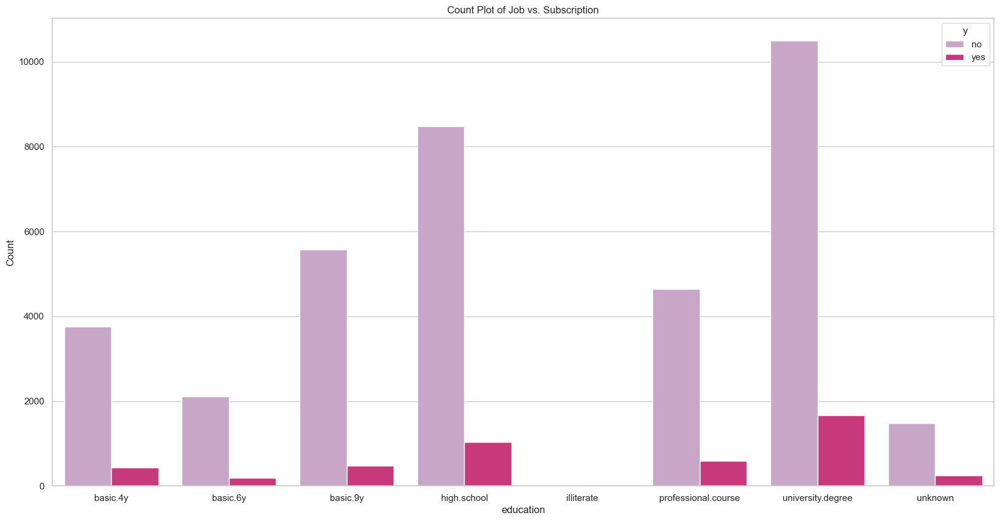

In [135]:
plot_categorical_count(df[['education', 'y']], x_column='education', hue_column='y', title='Count Plot of Job vs. Subscription', palette='PuRd')

In [136]:
# Plotly
plotly_categorical_count(df[['education', 'y']], x_column='education', hue_column='y', title='Count Plot of Education vs. Subscription')

In [137]:
df.groupby(['default','y'])['y'].count()

default  y  
no       no     28381
         yes     4196
unknown  no      8153
         yes      443
yes      no         3
         yes        0
Name: y, dtype: int64

In [138]:
pd.crosstab(df.y, df.default, margins=True).style.background_gradient(cmap='summer_r')

default,no,unknown,yes,All
y,,,,
no,28381,8153,3,36537
yes,4196,443,0,4639
All,32577,8596,3,41176


In [139]:
pd.crosstab([df.age, df.y], df.default, margins=True).style.background_gradient(cmap='summer_r')

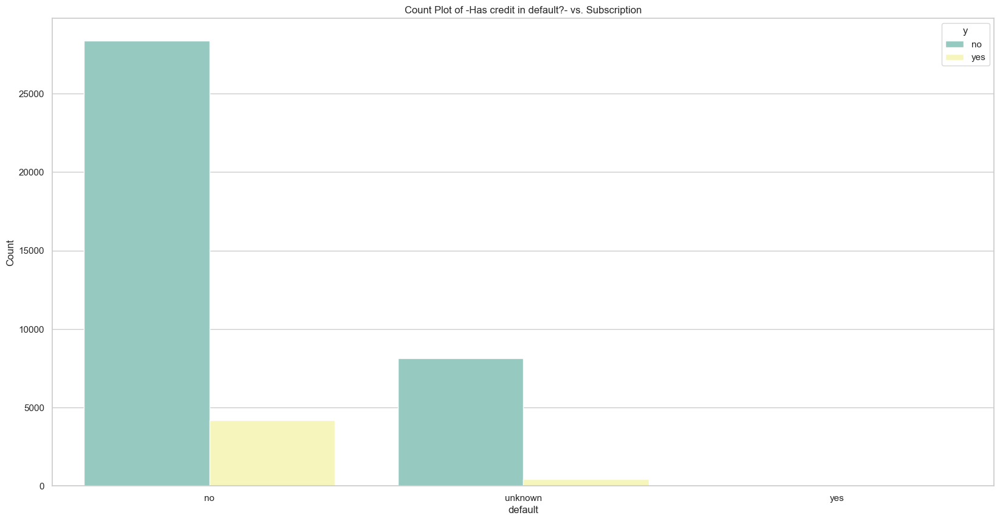

In [140]:
plot_categorical_count(df[['default', 'y']], x_column='default', hue_column='y', title='Count Plot of -Has credit in default?- vs. Subscription', palette='Set3')

In [141]:
# Plotly
plotly_categorical_count(df[['default', 'y']], x_column='default', hue_column='y', title='Count Plot of -Has credit in default?- vs. Subscription')


In [143]:
df.groupby(['housing','y'])['y'].count()

housing  y  
no       no     16590
         yes     2025
unknown  no       883
         yes      107
yes      no     19064
         yes     2507
Name: y, dtype: int64

In [144]:
pd.crosstab(df.y, df.housing, margins=True).style.background_gradient(cmap='summer_r')


housing,no,unknown,yes,All
y,,,,
no,16590,883,19064,36537
yes,2025,107,2507,4639
All,18615,990,21571,41176


In [145]:
pd.crosstab([df.marital, df.y], df.housing, margins=True).style.background_gradient(cmap='summer_r')


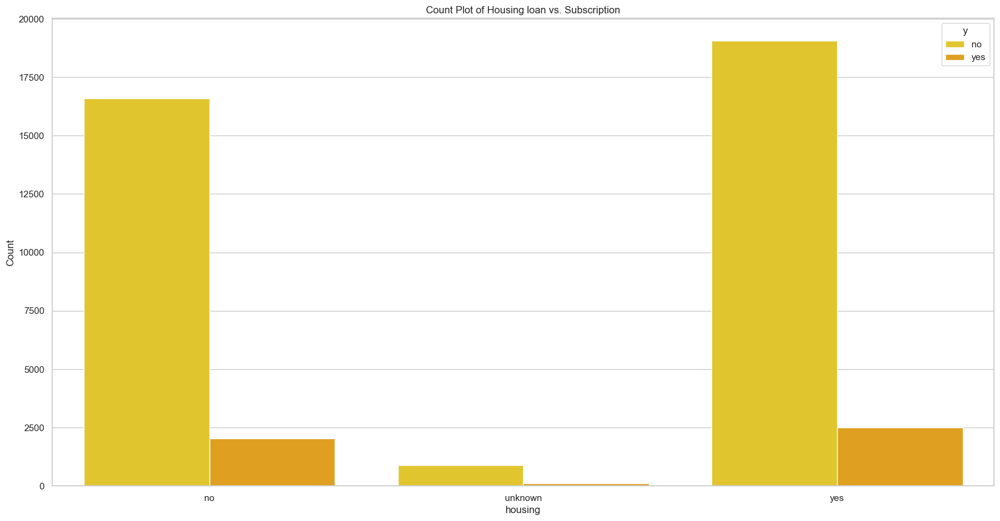

In [146]:
plot_categorical_count(df[['housing', 'y']], x_column='housing', hue_column='y', title='Count Plot of Housing loan vs. Subscription', palette='Wistia')


In [147]:
# Plotly
plotly_categorical_count(df[['housing', 'y']], x_column='housing', hue_column='y', title='Count Plot of Housing loan vs. Subscription')


In [148]:
df.groupby(['loan','y'])['y'].count()

loan     y  
no       no     30089
         yes     3849
unknown  no       883
         yes      107
yes      no      5565
         yes      683
Name: y, dtype: int64

In [149]:
pd.crosstab(df.y, df.loan, margins=True).style.background_gradient(cmap='summer_r')


loan,no,unknown,yes,All
y,,,,
no,30089,883,5565,36537
yes,3849,107,683,4639
All,33938,990,6248,41176


In [150]:
pd.crosstab([df.loan, df.y], df.marital, margins=True).style.background_gradient(cmap='summer_r')


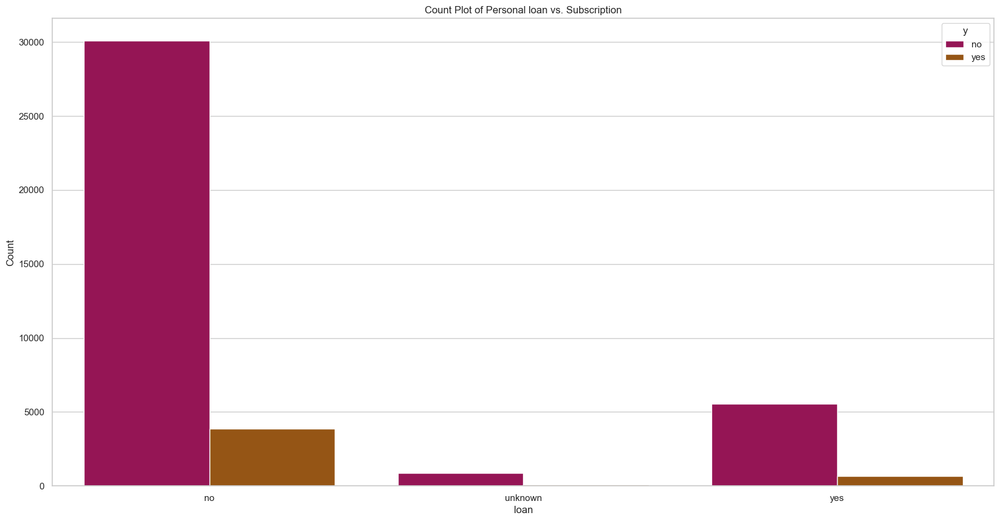

In [151]:
plot_categorical_count(df[['loan', 'y']], x_column='loan', hue_column='y', title='Count Plot of Personal loan vs. Subscription', palette='brg')


In [152]:
# Plotly
plotly_categorical_count(df[['loan', 'y']], x_column='loan', hue_column='y', title='Count Plot of Personal loan vs. Subscription')


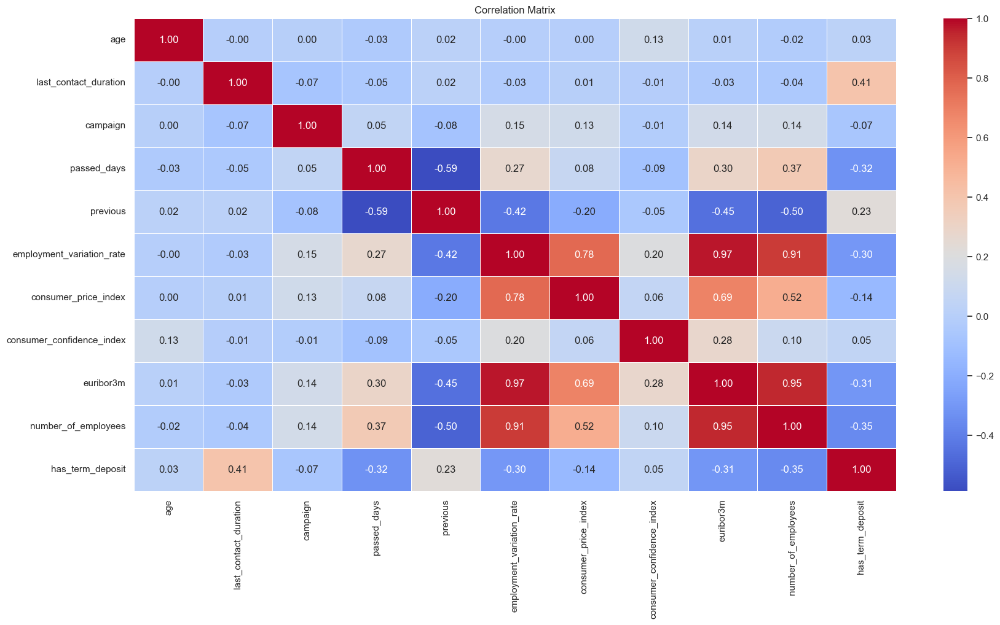

In [165]:
# Select the specified features
numeric_features = df[['age', 'last_contact_duration', 'campaign', 'passed_days', 'previous',
            'employment_variation_rate', 'consumer_price_index', 'consumer_confidence_index',
            'euribor3m', 'number_of_employees', 'has_term_deposit']]

# Calculate the correlation matrix
correlation_matrix = numeric_features.corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 10))

# Plot the correlation matrix using a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)

# Display the plot
plt.title('Correlation Matrix')
plt.show()


In [169]:
numeric_features = df[['age', 'last_contact_duration', 'campaign', 'passed_days', 'previous',
                       'employment_variation_rate', 'consumer_price_index', 'consumer_confidence_index',
                       'euribor3m', 'number_of_employees', 'has_term_deposit']]

# Calculate the correlation matrix
correlation_matrix = numeric_features.corr()

# Create a Plotly figure for the correlation matrix
fig = px.imshow(correlation_matrix,
                labels=dict(x="Features", y="Features", color="Correlation"),
                x=numeric_features.columns,
                y=numeric_features.columns,
                color_continuous_scale='blues',  # Choose an appropriate color scale
                title='Correlation Matrix')

# Customize the layout
fig.update_layout(width=1000, height=800)

# Show the figure
fig.show()


In [171]:
# Plot outliers for numerical variables using box plot

def plot_numerical_vars_with_outliers(df, column_name):
    plt.rcParams['axes.facecolor'] = '#f8fafc'
    plt.figure(figsize=(18, 10))

    sns.boxplot(x=df[column_name], palette='Paired')
    plt.title('Box Plot of Numerical Variables with Outliers')
    plt.show()
    

In [173]:
# Plot outliers for numerical variables using box plot (Plotly package)

def plot_numerical_vars_with_outliers_plotly(df, column_name, background_color='#f8fafc'):
    fig = go.Figure()

    fig.add_trace(go.Box(x=df[column_name], marker=dict(color='#f43f5e')))

    fig.update_layout(
        title=f'Box Plot of Numerical Variable {column_name} with Outliers',
        paper_bgcolor=background_color
    )

    fig.show()
    

In [172]:
# Plot distribution of categories for categorical variables.

def plot_categorical_vars_distribution(df, column_name):
    plt.rcParams['axes.facecolor'] = '#f8fafc'
    
    plt.figure(figsize=(18, 10))
    sns.countplot(x=df[column_name], palette='pastel')
    plt.title('Count Plot of Categorical Variables')
    plt.xticks(rotation=90)
    plt.show()  


In [174]:
# Plot distribution of categories for categorical variables (Plotly package)

def plot_categorical_vars_distribution_plotly(df, column_name, background_color='#f8fafc'):
    fig = px.bar(df[column_name].value_counts(), x=df[column_name].value_counts().index, y=df[column_name].value_counts().values, color=df[column_name].value_counts().index, labels={'x': column_name, 'y': 'Count'})

    fig.update_layout(
        title=f'Count Plot of Categorical Variable <b>{column_name}</b>',
        paper_bgcolor=background_color,
        xaxis_tickangle=-45
    )

    fig.show()


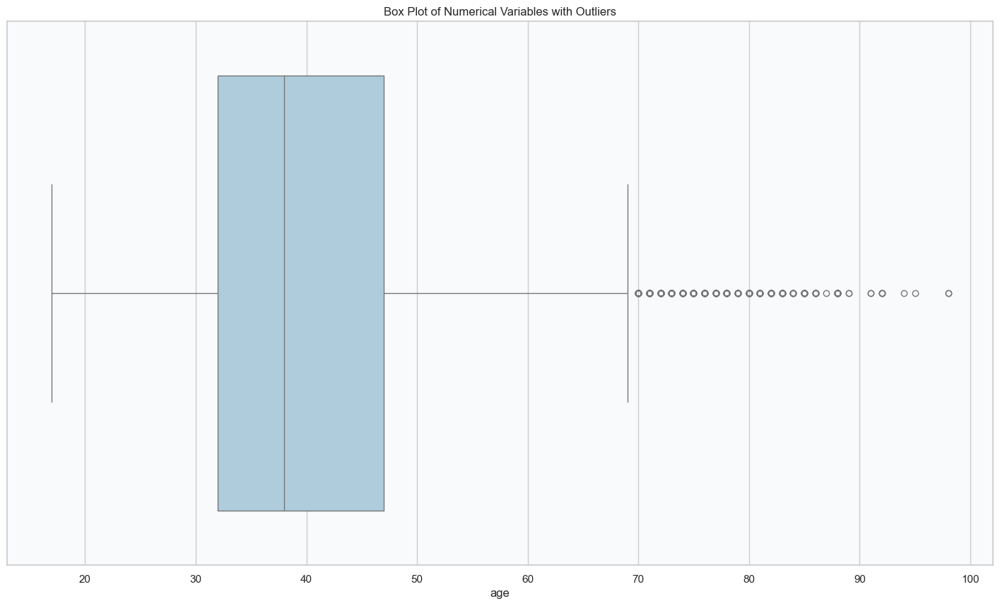

In [175]:
plot_numerical_vars_with_outliers(df, 'age')

In [176]:
plot_numerical_vars_with_outliers_plotly(df, 'age')


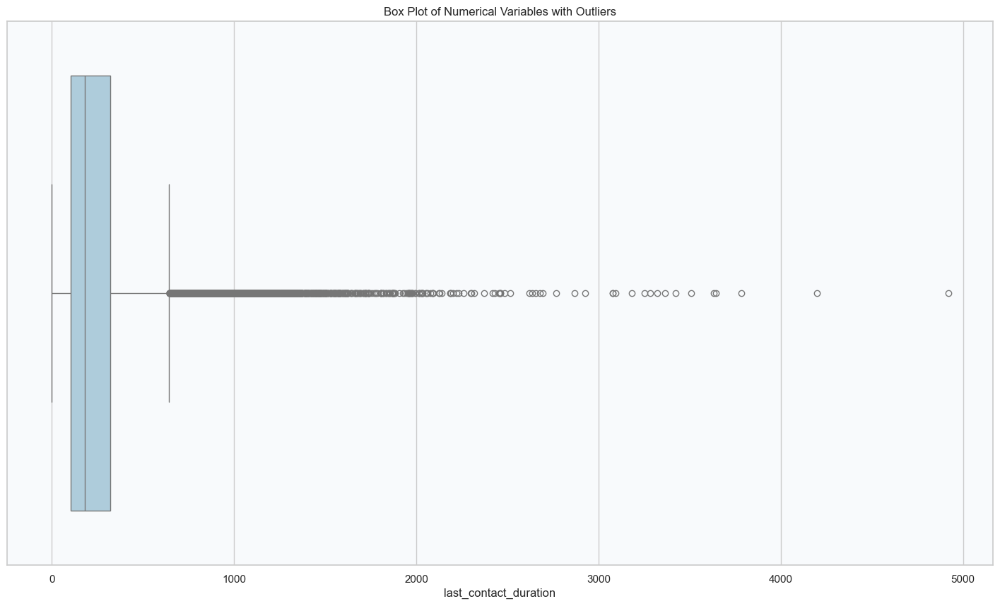

In [178]:
plot_numerical_vars_with_outliers(df, 'last_contact_duration')

In [179]:
plot_numerical_vars_with_outliers_plotly(df, 'last_contact_duration', '#E6ECF5')


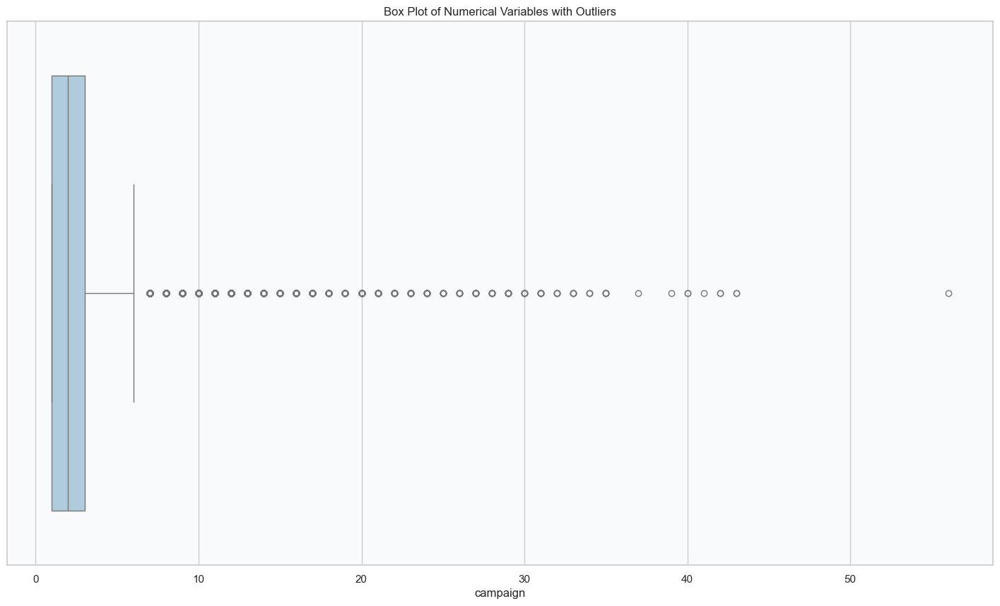

In [180]:
plot_numerical_vars_with_outliers(df, 'campaign')

In [181]:
plot_numerical_vars_with_outliers_plotly(df, 'campaign', '#E6ECF5')


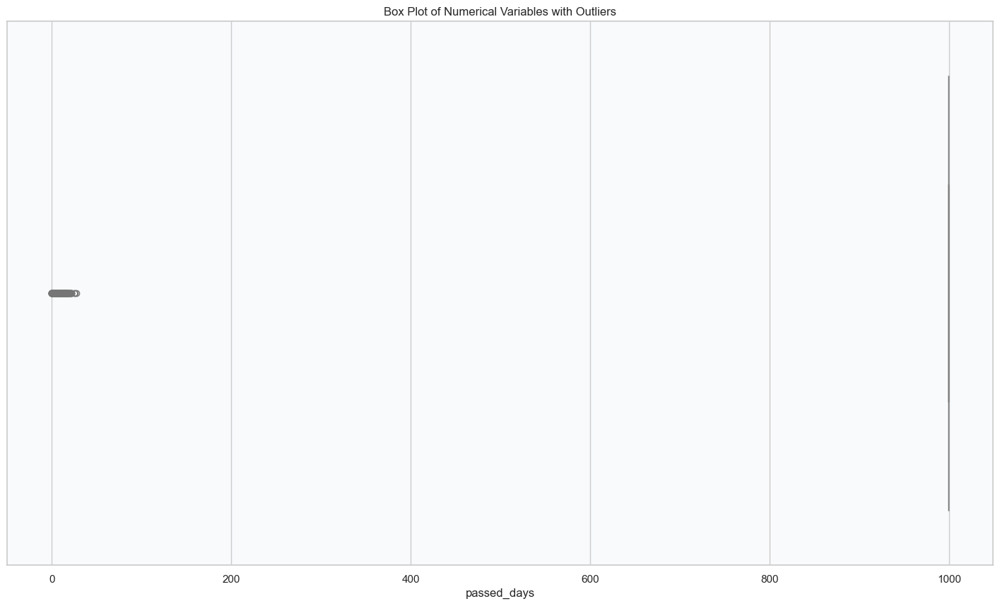

In [184]:
plot_numerical_vars_with_outliers(df, 'passed_days')

In [185]:
plot_numerical_vars_with_outliers_plotly(df, 'passed_days', '#E6ECF5')


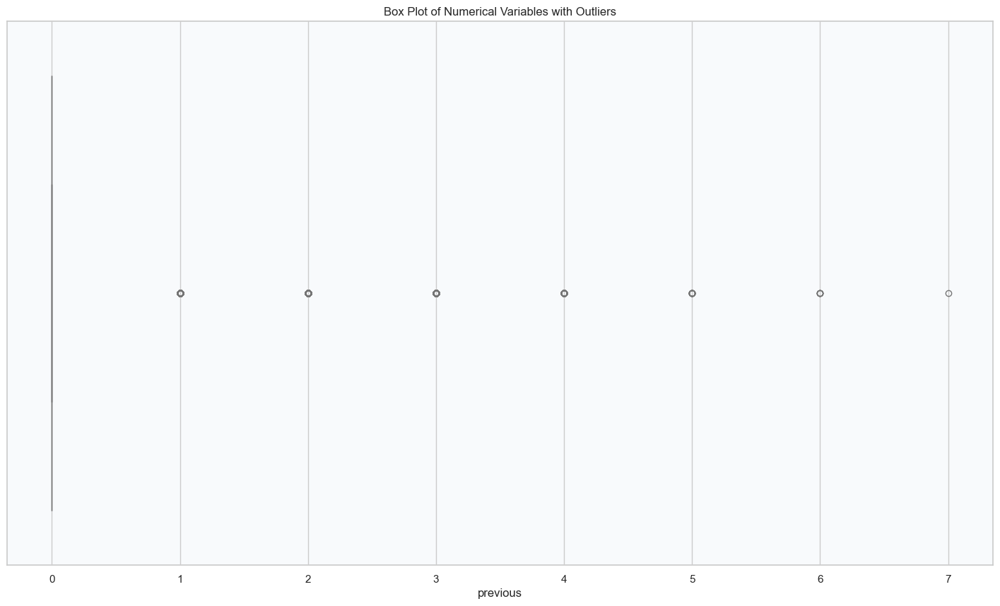

In [186]:
plot_numerical_vars_with_outliers(df, 'previous')

In [187]:
plot_numerical_vars_with_outliers_plotly(df, 'previous', '#E6ECF5')


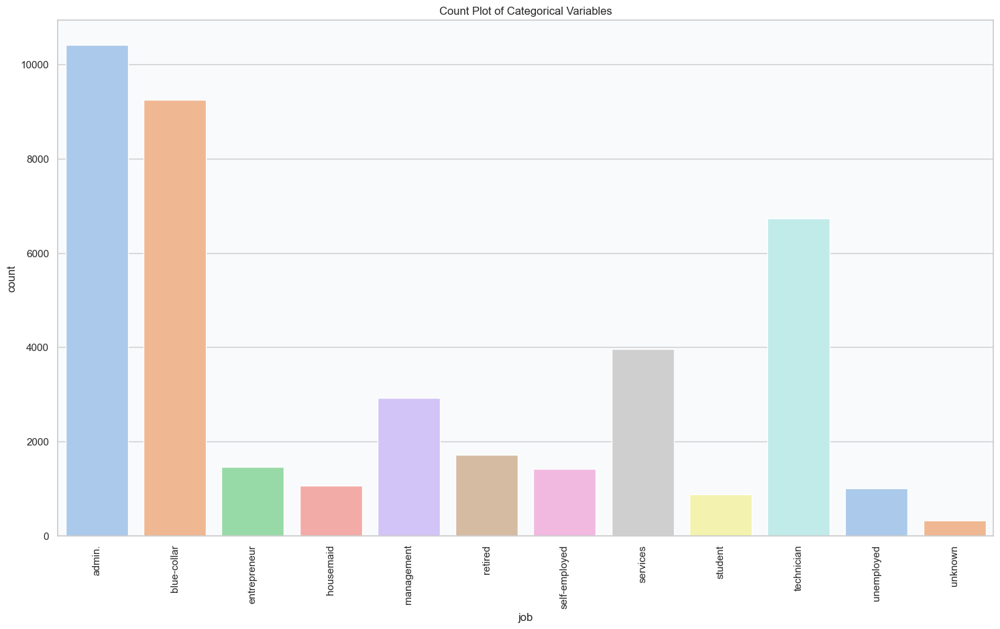

In [188]:
plot_categorical_vars_distribution(df, 'job')

In [189]:
plot_categorical_vars_distribution_plotly(df, 'job', '#E6ECF5')


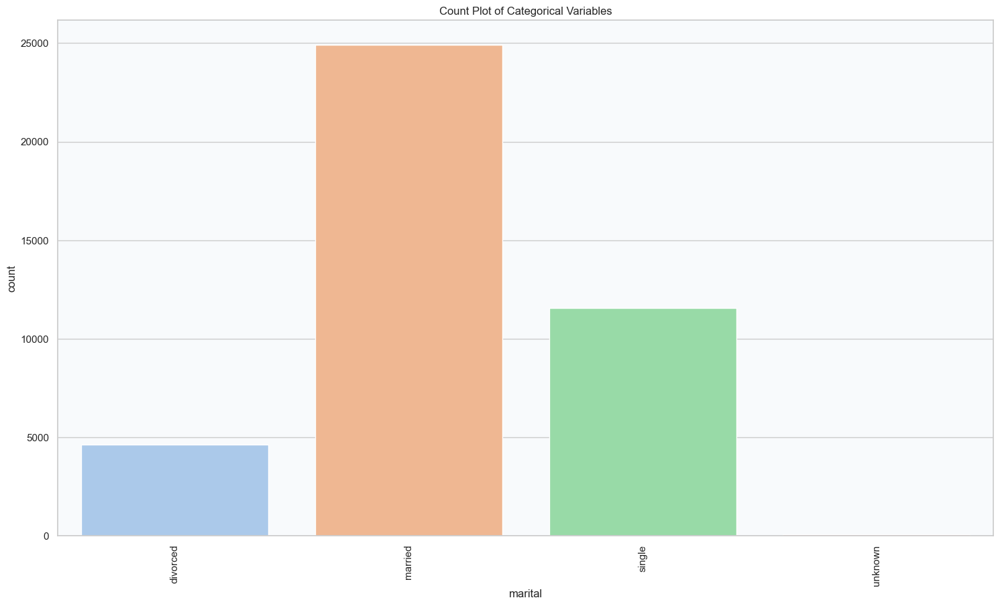

In [190]:
plot_categorical_vars_distribution(df, 'marital')


In [191]:
plot_categorical_vars_distribution_plotly(df, 'marital', '#E6ECF5')


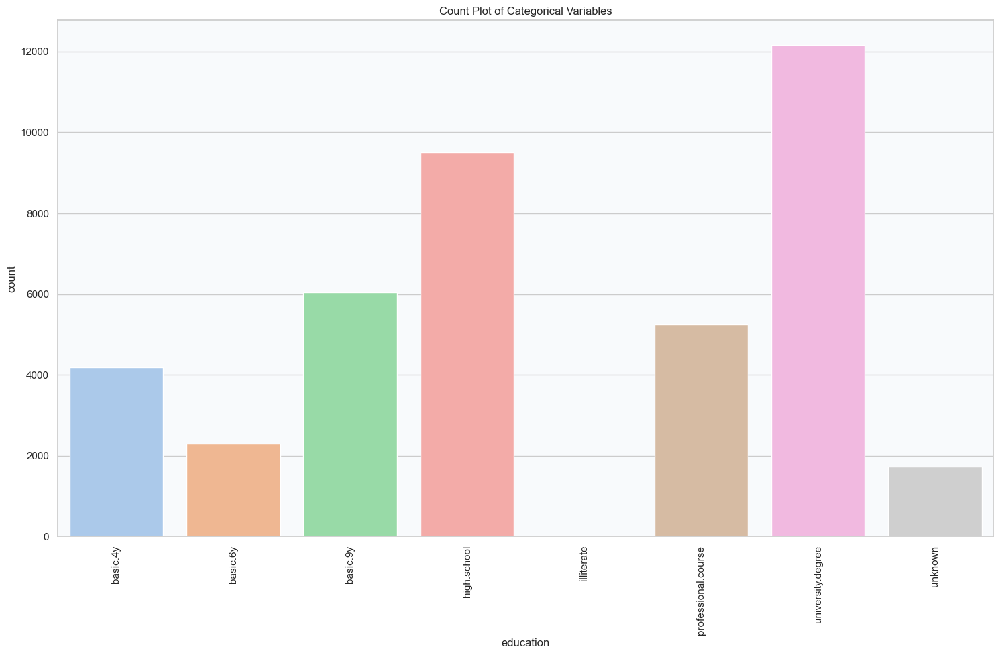

In [192]:
plot_categorical_vars_distribution(df, 'education')


In [193]:
plot_categorical_vars_distribution_plotly(df, 'education', '#E6ECF5')


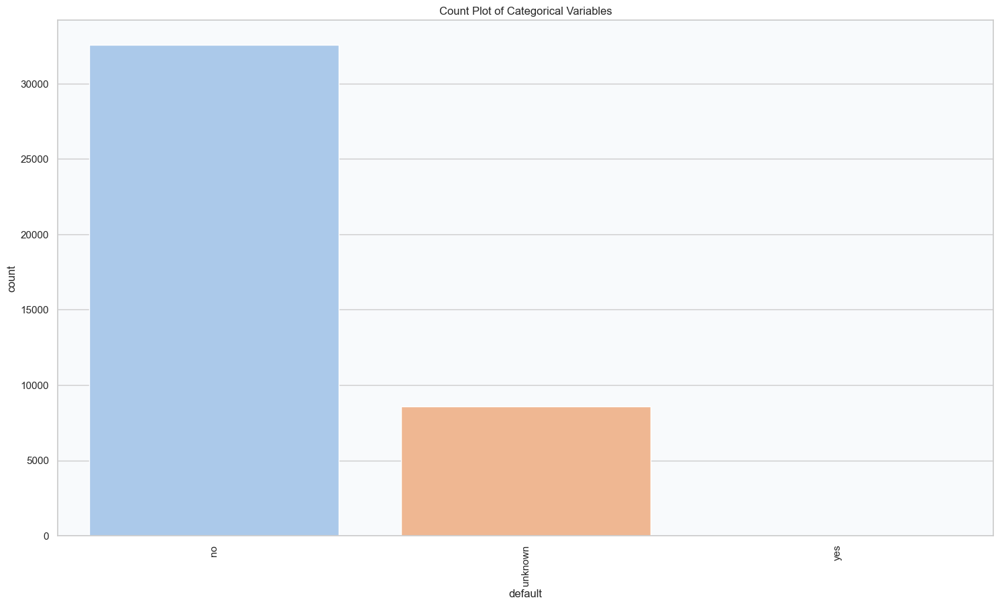

In [194]:
plot_categorical_vars_distribution(df, 'default')

In [195]:
plot_categorical_vars_distribution_plotly(df, 'default', '#E6ECF5')

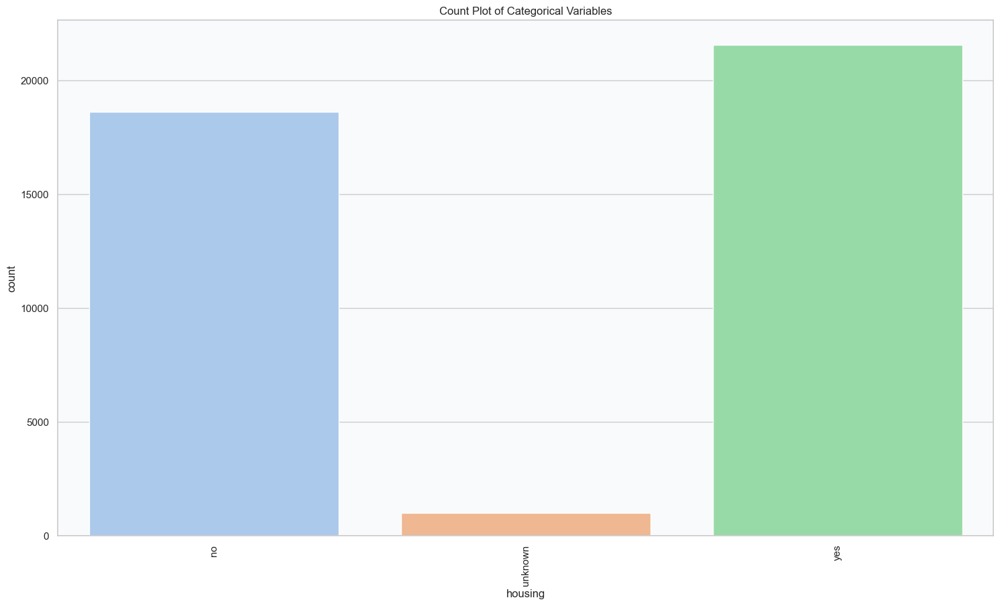

In [196]:
plot_categorical_vars_distribution(df, 'housing')


In [197]:
plot_categorical_vars_distribution_plotly(df, 'housing', '#E6ECF5')


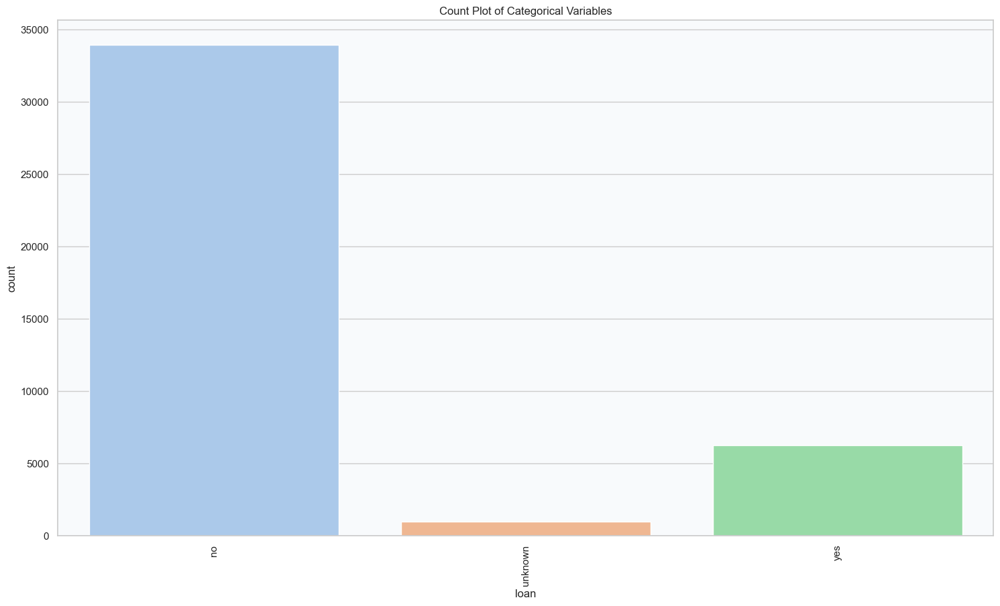

In [198]:
plot_categorical_vars_distribution(df, 'loan')


In [199]:
plot_categorical_vars_distribution_plotly(df, 'loan', '#E6ECF5')


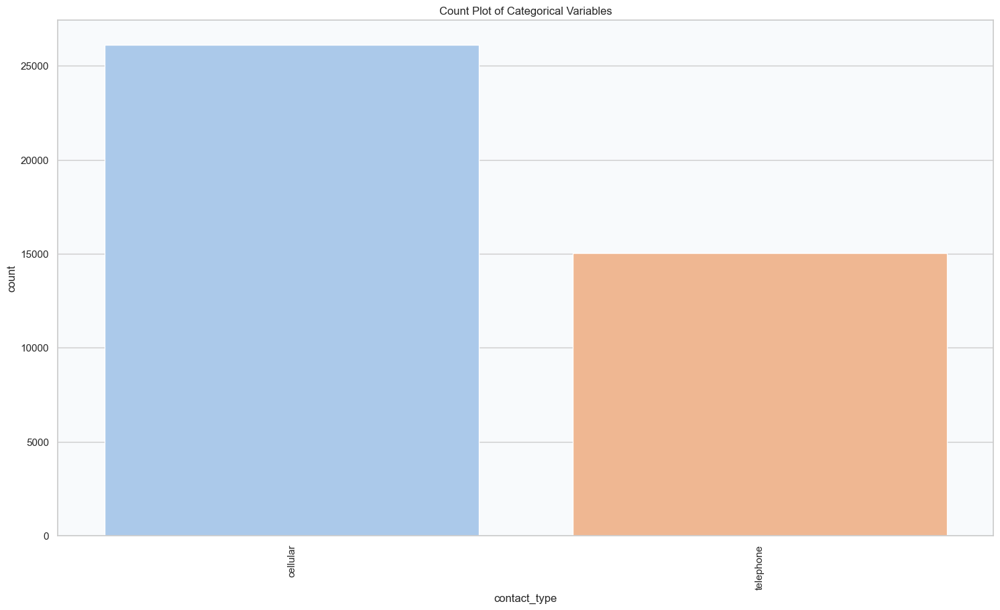

In [207]:
plot_categorical_vars_distribution(df, 'contact_type')


In [208]:
plot_categorical_vars_distribution_plotly(df, 'contact_type', '#E6ECF5')

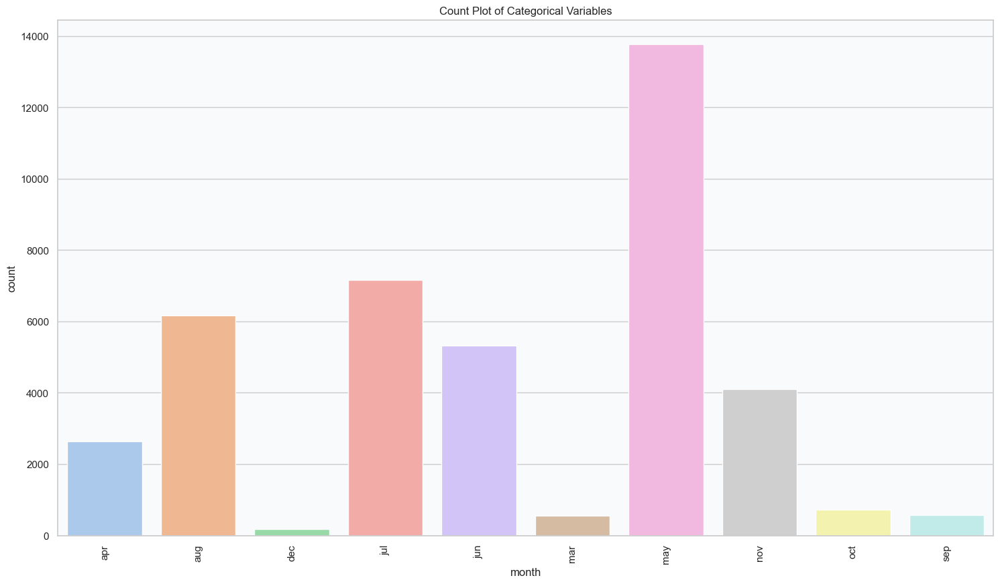

In [209]:
plot_categorical_vars_distribution(df, 'month')


In [210]:
plot_categorical_vars_distribution_plotly(df, 'month', '#E6ECF5')


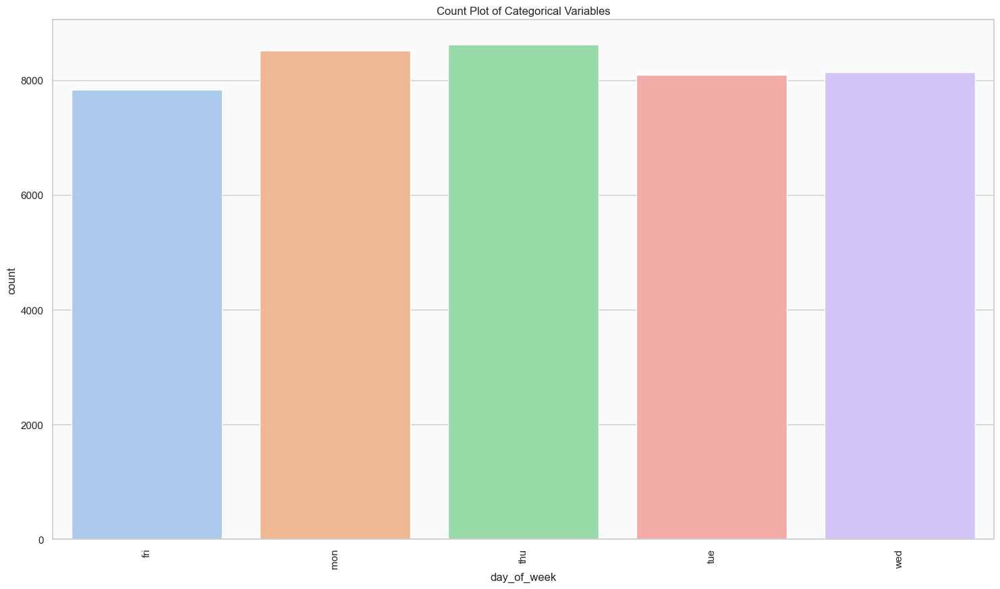

In [211]:
plot_categorical_vars_distribution(df, 'day_of_week')


In [212]:
plot_categorical_vars_distribution_plotly(df, 'day_of_week', '#E6ECF5')


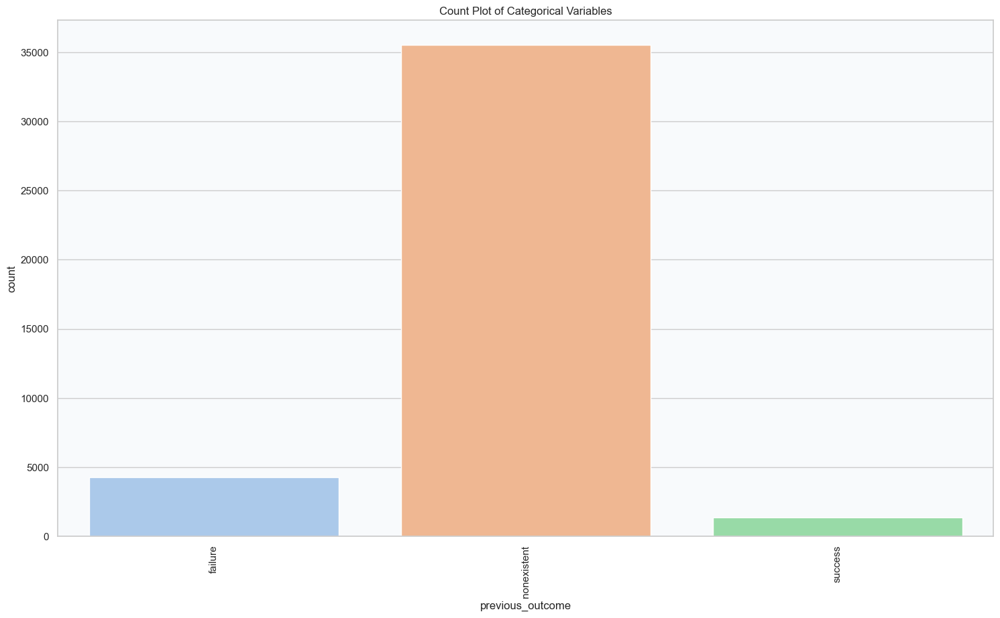

In [215]:
plot_categorical_vars_distribution(df, 'previous_outcome')


In [216]:
plot_categorical_vars_distribution_plotly(df, 'previous_outcome', '#E6ECF5')


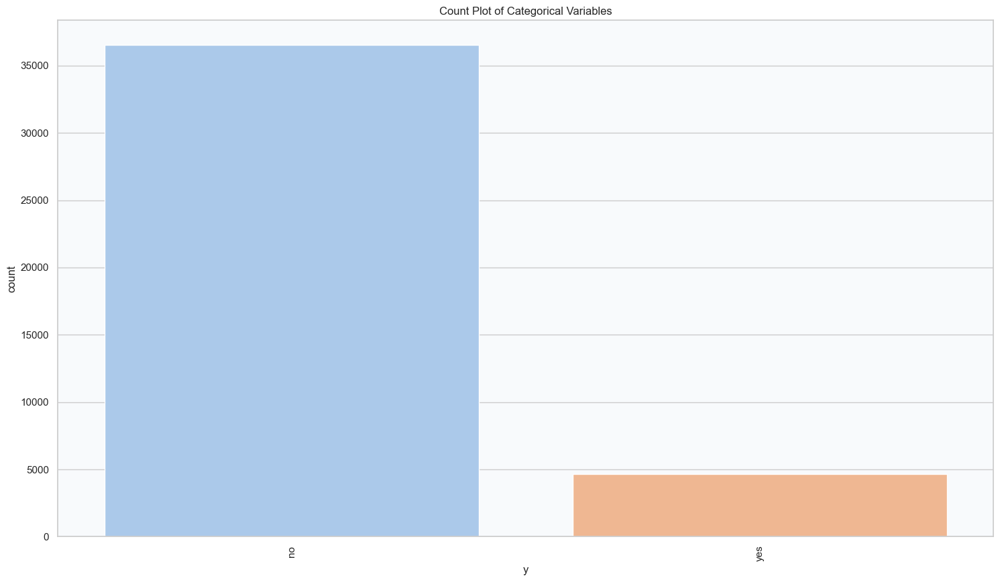

In [219]:
plot_categorical_vars_distribution(df, 'y')


In [220]:
# Distribution of the Target
plot_categorical_vars_distribution_plotly(df, 'y', '#E6ECF5')


[Text(0.5, 0, 'age'),
 Text(1.5, 0, 'last_contact_duration'),
 Text(2.5, 0, 'campaign'),
 Text(3.5, 0, 'passed_days'),
 Text(4.5, 0, 'previous'),
 Text(5.5, 0, 'employment_variation_rate'),
 Text(6.5, 0, 'consumer_price_index'),
 Text(7.5, 0, 'consumer_confidence_index'),
 Text(8.5, 0, 'euribor3m'),
 Text(9.5, 0, 'number_of_employees'),
 Text(10.5, 0, 'has_term_deposit')]

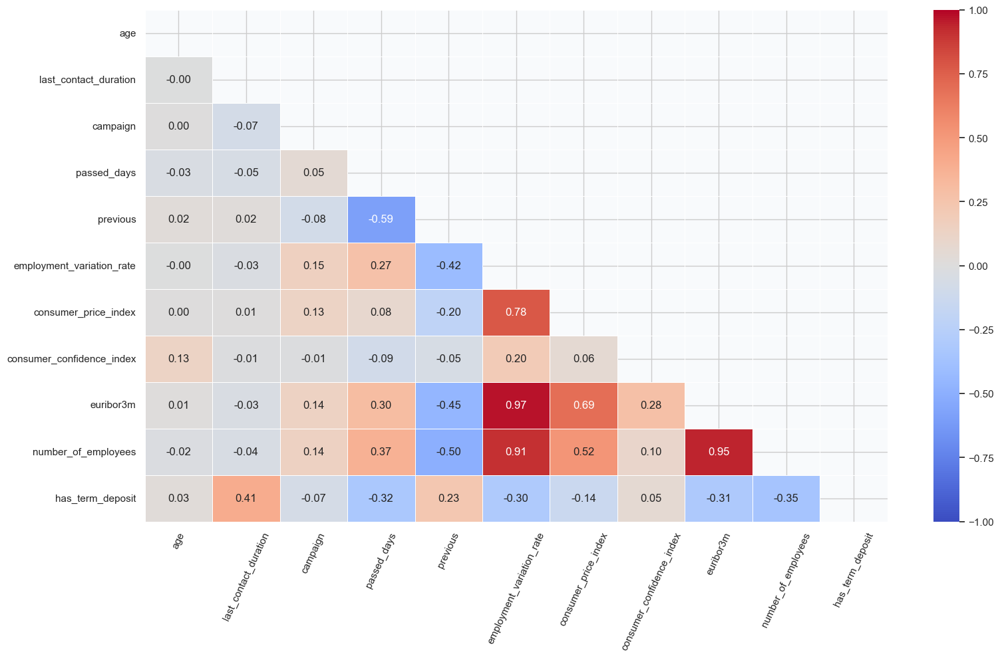

In [222]:
# Correlation matrix

fig, ax = plt.subplots(figsize=(18, 10))

df_corr = numeric_features.corr(method='pearson')
mask = np.zeros_like(df_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(data=df_corr, vmin=-1, vmax=1, mask=mask, 
            cmap=sns.color_palette('coolwarm', as_cmap=True),
            annot=True, fmt='.2f', linewidths=.5, ax=ax)

ax.set_xticklabels(ax.get_xticklabels(), rotation=65)
